In [1]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tqdm import tqdm
from tensorflow.python.training import moving_averages 

np.random.seed(235)

def he_init(shape):
  return tf.truncated_normal(shape=shape, stddev=.02)

In [0]:
tf.truncated_normal?

### Vanilla GAN :

In [0]:
# (X_train, y_train), (X_test, y_test) = tf.keras.datasets.cifar10.load_data()

(X_train, y_train), (X_test, y_test) = tf.keras.fashion_mnist.load_data()

X = np.concatenate([X_train, X_test])
y = np.concatenate([y_train, y_test])

X = X.astype('float32')

X = (X - 127.5)/127.5

In [0]:
X.shape

In [0]:
lr = .0002
bs = 128
epochs = 1000

img_dim = 784
gen_hid_dim = 256
disc_hid_dim = 256
z_noise_dim = 100

In [0]:
weights = dict(disc_H=tf.Variable(xavier_init((img_dim, disc_hid_dim))),\
               disc_final=tf.Variable(xavier_init((disc_hid_dim, 1))),\
               gen_H=tf.Variable(xavier_init((z_noise_dim, gen_hid_dim))),\
               gen_final=tf.Variable(xavier_init((gen_hid_dim, img_dim))))

bias = dict(disc_H=tf.Variable(xavier_init([disc_hid_dim])),\
            disc_final=tf.Variable(xavier_init([1])),\
            gen_H=tf.Variable(xavier_init([gen_hid_dim])),\
            gen_final=tf.Variable(xavier_init([img_dim])))

In [0]:
def discriminator(x):
  hidden_layer = tf.nn.relu(tf.add(tf.matmul(x, weights['disc_H']), bias['disc_H']))
  final_layer = tf.add(tf.matmul(hidden_layer, weights['disc_final']), bias['disc_final'])
  disc_output = tf.nn.sigmoid(final_layer)

  return final_layer, disc_output

def generator(x):
  hidden_layer = tf.nn.relu(tf.add(tf.matmul(x, weights['gen_H']), bias['gen_H']))
  final_layer = tf.add(tf.matmul(hidden_layer, weights['gen_final']), bias['gen_final'])
  gen_output = tf.nn.tanh(final_layer)

  return gen_output

z_input = tf.placeholder(tf.float32, [None, z_noise_dim], name='InputNoise')
x_input = tf.placeholder(tf.float32, [None, img_dim], name='realInput')

with tf.name_scope('Generator') as scope:
  output_gen = generator(z_input)

with tf.name_scope('Discriminator') as scope:
  logits_real_output_disc, real_output_disc = discriminator(x_input)
  logits_fake_output_disc, fake_output_disc = discriminator(output_gen)

In [0]:
with tf.name_scope('Disc_loss') as scope:
  disc_loss = -tf.reduce_mean(tf.log(real_output_disc + .0001) + tf.log(1. - fake_output_disc + .0001))

with tf.name_scope('Gen_loss') as scope:
  gen_loss = -tf.reduce_mean(tf.log(fake_output_disc + .0001))

disc_loss_total = tf.summary.scalar('Disc_loss', disc_loss)
gen_loss_total = tf.summary.scalar('Gen_loss', gen_loss)

In [0]:
disc_var = [weights['disc_H'], weights['disc_final'], bias['disc_H'], bias['disc_final']]
gen_var = [weights['gen_H'], weights['gen_final'], bias['gen_H'], bias['gen_final']]

with tf.name_scope('disc_optimizer') as scope:
  disc_opt = tf.train.AdamOptimizer(learning_rate=lr).minimize(disc_loss, var_list=disc_var)

with tf.name_scope('gen_optimizer') as scope:
  gen_opt = tf.train.AdamOptimizer(learning_rate=lr).minimize(gen_loss, var_list=gen_var)

In [0]:
init = tf.global_variables_initializer()

sess = tf.Session()

sess.run(init)
writer = tf.summary.FileWriter('./log', sess.graph)

In [0]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [0]:
%tensorboard --logdir log

Output hidden; open in https://colab.research.google.com to view.

In [0]:
for epoch in tqdm(range(1, epochs + 1)):
  for batch in range(X.shape[0]//bs + 1):
    idxs = np.random.randint(0, X.shape[0], bs)
    x_real = X[idxs]

    x_noise = np.random.normal(0, 1, [bs, z_noise_dim])

    _ = sess.run([disc_opt], feed_dict={x_input:x_real, z_input:x_noise})
    _ = sess.run([gen_opt], feed_dict={z_input:x_noise})

  x_noise = np.random.normal(0, 1, [X.shape[0], z_noise_dim])
  
  disc_loss_epoch = sess.run([disc_loss], feed_dict={x_input:X, z_input:x_noise})
  gen_loss_epoch = sess.run([gen_loss], feed_dict={z_input:x_noise})

  summary_disc_loss = sess.run(disc_loss_total, feed_dict={x_input:X, z_input:x_noise})
  writer.add_summary(summary_disc_loss, epoch)

  summary_gen_loss = sess.run(gen_loss_total, feed_dict={z_input:x_noise})
  writer.add_summary(summary_gen_loss, epoch)

  if not epoch % 20 :
    print('Epoch-{}, Disc Loss : {}, Gen Loss : {}'.format(epoch, disc_loss_epoch, gen_loss_epoch))

  2%|▏         | 20/1000 [01:02<51:22,  3.15s/it]

Epoch-20, Disc Loss : [0.75525594], Gen Loss : [1.8563411]


  4%|▍         | 40/1000 [02:04<48:45,  3.05s/it]

Epoch-40, Disc Loss : [0.80883765], Gen Loss : [2.1953773]


  6%|▌         | 60/1000 [03:06<48:59,  3.13s/it]

Epoch-60, Disc Loss : [0.8923847], Gen Loss : [2.2945473]


  8%|▊         | 80/1000 [04:08<47:37,  3.11s/it]

Epoch-80, Disc Loss : [0.99557143], Gen Loss : [2.2018077]


 10%|█         | 100/1000 [05:11<47:12,  3.15s/it]

Epoch-100, Disc Loss : [1.1077169], Gen Loss : [1.7291002]


 12%|█▏        | 120/1000 [06:13<45:52,  3.13s/it]

Epoch-120, Disc Loss : [1.0136216], Gen Loss : [1.8142561]


 14%|█▍        | 140/1000 [07:16<45:05,  3.15s/it]

Epoch-140, Disc Loss : [1.0300348], Gen Loss : [1.7123196]


 16%|█▌        | 160/1000 [08:19<44:16,  3.16s/it]

Epoch-160, Disc Loss : [1.1786273], Gen Loss : [1.37804]


 18%|█▊        | 180/1000 [09:23<44:00,  3.22s/it]

Epoch-180, Disc Loss : [1.1461202], Gen Loss : [1.1368303]


 20%|██        | 200/1000 [10:26<40:49,  3.06s/it]

Epoch-200, Disc Loss : [1.2540029], Gen Loss : [1.1573895]


 22%|██▏       | 220/1000 [11:27<40:08,  3.09s/it]

Epoch-220, Disc Loss : [1.2078478], Gen Loss : [1.2156879]


 24%|██▍       | 240/1000 [12:29<39:50,  3.15s/it]

Epoch-240, Disc Loss : [1.1594021], Gen Loss : [1.259925]


 26%|██▌       | 260/1000 [13:32<39:27,  3.20s/it]

Epoch-260, Disc Loss : [1.0726018], Gen Loss : [1.1422056]


 28%|██▊       | 280/1000 [14:36<38:25,  3.20s/it]

Epoch-280, Disc Loss : [1.1644005], Gen Loss : [1.1239271]


 30%|███       | 300/1000 [15:39<36:34,  3.13s/it]

Epoch-300, Disc Loss : [1.1057551], Gen Loss : [1.229145]


 32%|███▏      | 320/1000 [16:42<35:29,  3.13s/it]

Epoch-320, Disc Loss : [1.2329464], Gen Loss : [1.254267]


 34%|███▍      | 340/1000 [17:46<35:18,  3.21s/it]

Epoch-340, Disc Loss : [1.1909703], Gen Loss : [1.0507865]


 36%|███▌      | 360/1000 [18:50<34:04,  3.20s/it]

Epoch-360, Disc Loss : [1.2162594], Gen Loss : [1.0634321]


 38%|███▊      | 380/1000 [19:54<32:46,  3.17s/it]

Epoch-380, Disc Loss : [1.1186299], Gen Loss : [1.1775322]


 40%|████      | 400/1000 [20:57<31:12,  3.12s/it]

Epoch-400, Disc Loss : [1.1457099], Gen Loss : [1.1459707]


 42%|████▏     | 420/1000 [21:59<30:19,  3.14s/it]

Epoch-420, Disc Loss : [1.153784], Gen Loss : [1.1235721]


 44%|████▍     | 440/1000 [23:03<29:37,  3.17s/it]

Epoch-440, Disc Loss : [1.175896], Gen Loss : [1.0969815]


 46%|████▌     | 460/1000 [24:06<28:31,  3.17s/it]

Epoch-460, Disc Loss : [1.1333181], Gen Loss : [1.1889849]


 48%|████▊     | 480/1000 [25:10<27:21,  3.16s/it]

Epoch-480, Disc Loss : [1.1553451], Gen Loss : [1.155394]


 50%|█████     | 500/1000 [26:14<26:46,  3.21s/it]

Epoch-500, Disc Loss : [1.153956], Gen Loss : [1.0469412]


 52%|█████▏    | 520/1000 [27:17<25:20,  3.17s/it]

Epoch-520, Disc Loss : [1.1376288], Gen Loss : [1.1603051]


 54%|█████▍    | 540/1000 [28:20<24:13,  3.16s/it]

Epoch-540, Disc Loss : [1.1974424], Gen Loss : [1.1067331]


 56%|█████▌    | 560/1000 [29:24<23:08,  3.16s/it]

Epoch-560, Disc Loss : [1.1015418], Gen Loss : [1.158079]


 58%|█████▊    | 580/1000 [30:27<22:05,  3.16s/it]

Epoch-580, Disc Loss : [1.120762], Gen Loss : [1.0864824]


 60%|██████    | 600/1000 [31:31<21:02,  3.16s/it]

Epoch-600, Disc Loss : [1.0898591], Gen Loss : [1.1572175]


 62%|██████▏   | 620/1000 [32:34<20:06,  3.18s/it]

Epoch-620, Disc Loss : [1.1329466], Gen Loss : [1.1011838]


 64%|██████▍   | 640/1000 [33:37<18:52,  3.15s/it]

Epoch-640, Disc Loss : [1.125355], Gen Loss : [1.0493215]


 66%|██████▌   | 660/1000 [34:40<17:45,  3.13s/it]

Epoch-660, Disc Loss : [1.1018189], Gen Loss : [1.0823216]


 68%|██████▊   | 680/1000 [35:44<16:39,  3.12s/it]

Epoch-680, Disc Loss : [1.1216564], Gen Loss : [1.1091543]


 70%|███████   | 700/1000 [36:47<15:29,  3.10s/it]

Epoch-700, Disc Loss : [1.0954611], Gen Loss : [0.970244]


 72%|███████▏  | 720/1000 [37:50<14:55,  3.20s/it]

Epoch-720, Disc Loss : [1.1113116], Gen Loss : [1.1219689]


 74%|███████▍  | 740/1000 [38:52<13:30,  3.12s/it]

Epoch-740, Disc Loss : [1.0977201], Gen Loss : [1.0920498]


 76%|███████▌  | 760/1000 [39:54<12:26,  3.11s/it]

Epoch-760, Disc Loss : [1.0858707], Gen Loss : [1.1332515]


 78%|███████▊  | 780/1000 [40:57<11:34,  3.16s/it]

Epoch-780, Disc Loss : [1.0821496], Gen Loss : [1.0611469]


 80%|████████  | 800/1000 [41:59<10:20,  3.10s/it]

Epoch-800, Disc Loss : [1.058585], Gen Loss : [1.1212746]


 82%|████████▏ | 820/1000 [43:01<09:17,  3.10s/it]

Epoch-820, Disc Loss : [1.0647004], Gen Loss : [1.1376425]


 84%|████████▍ | 840/1000 [44:04<08:28,  3.18s/it]

Epoch-840, Disc Loss : [1.0588299], Gen Loss : [1.1713442]


 86%|████████▌ | 860/1000 [45:06<07:20,  3.14s/it]

Epoch-860, Disc Loss : [1.0593092], Gen Loss : [1.0932736]


 88%|████████▊ | 880/1000 [46:10<06:16,  3.13s/it]

Epoch-880, Disc Loss : [1.0568428], Gen Loss : [1.2208623]


 90%|█████████ | 900/1000 [47:13<05:16,  3.17s/it]

Epoch-900, Disc Loss : [1.0441438], Gen Loss : [1.1382998]


 92%|█████████▏| 920/1000 [48:15<04:10,  3.13s/it]

Epoch-920, Disc Loss : [1.075506], Gen Loss : [1.1331235]


 94%|█████████▍| 940/1000 [49:18<03:07,  3.13s/it]

Epoch-940, Disc Loss : [1.0269053], Gen Loss : [1.2108228]


 96%|█████████▌| 960/1000 [50:21<02:07,  3.19s/it]

Epoch-960, Disc Loss : [1.0512282], Gen Loss : [1.1672592]


 98%|█████████▊| 980/1000 [51:23<01:02,  3.10s/it]

Epoch-980, Disc Loss : [1.0512146], Gen Loss : [1.1331617]


100%|██████████| 1000/1000 [52:26<00:00,  3.10s/it]

Epoch-1000, Disc Loss : [1.0324333], Gen Loss : [1.2301278]


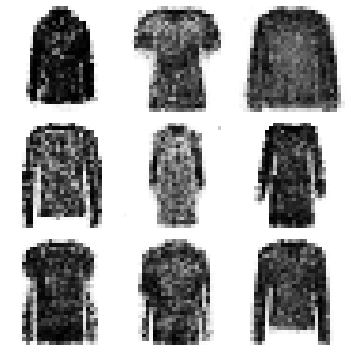

In [0]:
fig, axs = plt.subplots(3, 3, figsize=(5, 5))
axs = axs.flatten()

for idx, ax in enumerate(X[:9].reshape(9, 28, 28)):
  axs[idx].imshow(out[idx], interpolation='nearest', cmap='binary')
  axs[idx].axis('off')

plt.tight_layout()
plt.show()

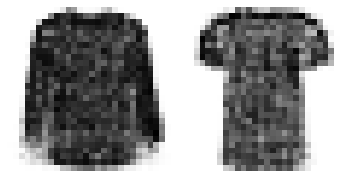

In [0]:
n = 2

z_noise = np.random.normal(0, 1, [n, z_noise_dim])

out = sess.run(output_gen, feed_dict={z_input:z_noise})
out = out.reshape(out.shape[0], 28, 28)

fig, axs = plt.subplots(1, 2, figsize=(5, 5))
axs = axs.flatten()

for idx, ax in enumerate(axs):
  ax.imshow(out[idx], interpolation='nearest', cmap='binary')
  ax.axis('off')

plt.tight_layout()
plt.show()

### DC GAN:

#### Basic :

In [0]:
# https://stackoverflow.com/a/44020133/9079093
def batch_norm(x, scope, is_training, epsilon=0.0001, decay=0.9, name=None):
    
    assert isinstance(is_training, (tf.python.ops.Tensor, tf.Variable)) and is_training.dtype == tf.bool

    return tf.cond(
        is_training,
        lambda: batch_norm_layer(x=x, scope=scope, epsilon=epsilon, decay=decay, is_training=True, reuse=None, name=name),
        lambda: batch_norm_layer(x=x, scope=scope, epsilon=epsilon, decay=decay, is_training=False, reuse=True, name=name),
    )


def batch_norm_layer(x, scope, is_training, epsilon=0.0001, decay=0.9, reuse=None, name=None):
    
    with tf.variable_scope(scope, reuse=reuse):
        shape = x.get_shape().as_list()
        # gamma: a trainable scale factor
        gamma = tf.get_variable(name+"_gamma", shape[-1], initializer=tf.constant_initializer(1.0), trainable=True)
        # beta: a trainable shift value
        beta = tf.get_variable(name+"_beta", shape[-1], initializer=tf.constant_initializer(0.0), trainable=True)
        moving_avg = tf.get_variable(name+"_moving_avg", shape[-1], initializer=tf.constant_initializer(0.0), trainable=False)
        moving_var = tf.get_variable(name+"_moving_var", shape[-1], initializer=tf.constant_initializer(1.0), trainable=False)
        if is_training:
            # tf.nn.moments == Calculate the mean and the variance of the tensor x
            avg, var = tf.nn.moments(x, list(range(len(shape)-1)))
            update_moving_avg = moving_averages.assign_moving_average(moving_avg, avg, decay)
            update_moving_var = moving_averages.assign_moving_average(moving_var, var, decay)
            control_inputs = [update_moving_avg, update_moving_var]
        else:
            avg = moving_avg
            var = moving_var
            control_inputs = []
        with tf.control_dependencies(control_inputs):
            output = tf.nn.batch_normalization(x, avg, var, offset=beta, scale=gamma, variance_epsilon=epsilon)

    return output

def generator_new_conv_layer(inp, train, bn, scope, num_input_channels, filter_size, num_filters, name, weights_dict, bias_dict, out_size):
    
        # Shape of the filter-weights for the convolution
        shape = [filter_size, filter_size, num_filters, num_input_channels]

        # Create new weights (filters) with the given shape
        weights_dict[name] = tf.get_variable(name, shape, initializer = custom_initializer(stddev=.02))
        
        # Create new biases, one for each filter
        # bias_dict[name] = tf.Variable(he_init(shape=[num_filters]))

        layer = tf.nn.conv2d_transpose(inp, filter=weights_dict[name], output_shape=[tf.shape(inp)[0], out_size, out_size, num_filters],\
                                       strides=[1,2,2,1], padding='SAME')
        # layer += bias_dict[name]

        if bn:
          layer = batch_norm(layer, scope, train, epsilon=.00005, decay=.9, name=name)
        
        # https://stackoverflow.com/a/33950177/9079093
        
        return layer

def discriminator_new_conv_layer(inp, train, bn, scope, num_input_channels, filter_size, num_filters, name, weights_dict, bias_dict, stride=None):

        # Shape of the filter-weights for the convolution
        shape = [filter_size, filter_size, num_input_channels, num_filters]

        # Create new weights (filters) with the given shape
        weights_dict[name]  = tf.get_variable(name, shape, initializer = custom_initializer(stddev=.02))
        
        # Create new biases, one for each filter
        # bias_dict[name] = tf.Variable(he_init(shape=[num_filters]))
        
        # TensorFlow operation for convolution
        layer = tf.nn.conv2d(inp, filter=weights_dict[name], strides=([1,2,2,1] if not stride else stride), padding='SAME')
        # layer += bias_dict[name]
        
        if bn:
          layer = batch_norm(layer, scope, train, epsilon=.00005, decay=.9, name=name)
        
        # https://stackoverflow.com/a/33950177/9079093
        
        return layer

#### Generator :

In [0]:
n_filters = 128
output_shape = 8
filter_size = 5

img_wid = img_hei = 64
input_channels = 3

z_noise_dim = 100

In [0]:
initializer = tf.truncated_normal_initializer
# initializer = tf.glorot_normal_initializer
# initializer = tf.initializers.he_normal

def custom_initializer(stddev=.02):
  # return initializer(seed=235)
  return initializer(stddev=stddev)

In [56]:
tf.reset_default_graph()

weights = dict()

bias = dict()

def generator(x, train):
  with tf.variable_scope('Generator') as scope:
    weights['gen_inp'] = tf.get_variable('gen_inp', [z_noise_dim, 4*4*n_filters*2], initializer = custom_initializer(stddev=.02))
    # bias['gen_inp'] = tf.Variable(he_init([4*4*1024]))

    print(x.shape)
    
    # inp = tf.contrib.layers.batch_norm(tf.matmul(x, weights['gen_inp']), is_training=train, decay=.9)
    inp = tf.nn.leaky_relu(batch_norm(tf.matmul(x, weights['gen_inp']), scope, train, epsilon=.0001, decay=.9, name='gen_inp_BN'))
    # inp += bias['gen_inp']
    
    inp = tf.reshape(inp, shape=[tf.shape(inp)[0], 4, 4, n_filters*2]) # https://github.com/tensorflow/tensorflow/issues/7253
    print(inp.shape)
    
    conv_1 = tf.nn.leaky_relu(generator_new_conv_layer(inp, train, True, scope,\
                                                       num_input_channels = n_filters * 2,\
                                                       filter_size = filter_size,\
                                                       num_filters = n_filters,\
                                                       name='gen_conv_1', weights_dict = weights, bias_dict = bias, out_size=output_shape*1))
    print(conv_1.shape)
    
    conv_2 = tf.nn.leaky_relu(generator_new_conv_layer(conv_1, train, True, scope,\
                                                       num_input_channels = n_filters,\
                                                       filter_size = filter_size,\
                                                       num_filters = n_filters,\
                                                       name='gen_conv_2', weights_dict = weights, bias_dict = bias, out_size=output_shape*2))
    print(conv_2.shape)
    
    conv_3 = tf.nn.leaky_relu(generator_new_conv_layer(conv_2, train, True, scope,\
                                                       num_input_channels = n_filters,\
                                                       filter_size = filter_size,\
                                                       num_filters = n_filters,\
                                                       name='gen_conv_3', weights_dict = weights, bias_dict = bias, out_size=output_shape*4))
    print(conv_3.shape)
    
    gen_output = tf.nn.tanh(generator_new_conv_layer(conv_3, train, False, scope,\
                                                     num_input_channels = n_filters,\
                                                     filter_size = filter_size,\
                                                     num_filters = input_channels,\
                                                     name='gen_conv_4', weights_dict = weights, bias_dict = bias, out_size=output_shape*8))
                                                     
    print(gen_output.shape)

  return gen_output

z_input = tf.placeholder(tf.float32, [None, z_noise_dim], name='NoiseInput')
x_input = tf.placeholder(tf.float32, [None, img_wid, img_hei, input_channels], name='RealInput') 

x_input += tf.random_normal(shape=tf.shape(x_input), mean=.0, stddev=np.random.uniform(.0, .1), dtype=tf.float32)


train = tf.placeholder(tf.bool, name='train_bool')


# Creating generator
output_gen = generator(z_input, train)

# Generator weight vars
tf.trainable_variables('Gen')

(?, 100)
(?, 4, 4, 256)
(?, 8, 8, 128)
(?, 16, 16, 128)
(?, 32, 32, 128)
(?, 64, 64, 3)


[<tf.Variable 'Generator/gen_inp:0' shape=(100, 4096) dtype=float32_ref>,
 <tf.Variable 'Generator/gen_inp_BN_gamma:0' shape=(4096,) dtype=float32_ref>,
 <tf.Variable 'Generator/gen_inp_BN_beta:0' shape=(4096,) dtype=float32_ref>,
 <tf.Variable 'Generator/gen_conv_1:0' shape=(5, 5, 128, 256) dtype=float32_ref>,
 <tf.Variable 'Generator/gen_conv_1_gamma:0' shape=(128,) dtype=float32_ref>,
 <tf.Variable 'Generator/gen_conv_1_beta:0' shape=(128,) dtype=float32_ref>,
 <tf.Variable 'Generator/gen_conv_2:0' shape=(5, 5, 128, 128) dtype=float32_ref>,
 <tf.Variable 'Generator/gen_conv_2_gamma:0' shape=(128,) dtype=float32_ref>,
 <tf.Variable 'Generator/gen_conv_2_beta:0' shape=(128,) dtype=float32_ref>,
 <tf.Variable 'Generator/gen_conv_3:0' shape=(5, 5, 128, 128) dtype=float32_ref>,
 <tf.Variable 'Generator/gen_conv_3_gamma:0' shape=(128,) dtype=float32_ref>,
 <tf.Variable 'Generator/gen_conv_3_beta:0' shape=(128,) dtype=float32_ref>,
 <tf.Variable 'Generator/gen_conv_4:0' shape=(5, 5, 128, 1

#### Discriminator :

In [57]:
def discriminator(x, train, reuse=None):
  with tf.variable_scope('Discriminator', reuse=reuse) as scope:
    print(x.shape)
    conv_1 = tf.nn.leaky_relu(discriminator_new_conv_layer(x, train, False, scope,\
                                                           num_input_channels = input_channels,\
                                                           filter_size = filter_size,\
                                                           num_filters = n_filters,\
                                                           name='disc_conv_1', weights_dict = weights, bias_dict = bias))
    print(conv_1.shape)
    conv_2 = tf.nn.leaky_relu(discriminator_new_conv_layer(conv_1, train, True, scope,\
                                                           num_input_channels = n_filters,\
                                                           filter_size = filter_size,\
                                                           num_filters = n_filters,\
                                                           name='disc_conv_2', weights_dict = weights, bias_dict = bias))
    print(conv_2.shape)
    conv_3 = tf.nn.leaky_relu(discriminator_new_conv_layer(conv_2, train, True, scope,\
                                                           num_input_channels = n_filters,\
                                                           filter_size = filter_size,\
                                                           num_filters = n_filters,\
                                                           name='disc_conv_3', weights_dict = weights, bias_dict = bias))
    print(conv_3.shape)
    conv_4 = tf.nn.leaky_relu(discriminator_new_conv_layer(conv_3, train, True, scope,\
                                                           num_input_channels = n_filters,\
                                                           filter_size = filter_size,\
                                                           num_filters = n_filters*2,\
                                                           name='disc_conv_4', weights_dict = weights, bias_dict = bias))
    print(conv_4.shape)

    num_features = conv_4.get_shape()[1:4].num_elements()
    print(num_features)

    flatten = tf.reshape(conv_4, shape=[tf.shape(conv_4)[0], num_features])
    
    weights['disc_final_hidden'] = tf.get_variable('disc_final_hidden', [num_features, 1], initializer = custom_initializer(stddev=.02))
    # bias['disc_final_hidden'] = tf.Variable(he_init([1]))
    
    final_layer = tf.matmul(flatten, weights['disc_final_hidden']) #batch_norm(tf.matmul(flatten, weights['disc_final_hidden']), scope, train, epsilon=.0001, decay=.9, name='disc_final_hidden_BN')
    # final_layer += bias['disc_final_hidden']

    disc_output = tf.nn.sigmoid(tf.nn.dropout(final_layer, rate=.4))

  return final_layer, disc_output


# Creating Discriminator
logits_real_output_disc, real_output_disc = discriminator(x_input, train)
logits_fake_output_disc, fake_output_disc = discriminator(output_gen, train, reuse=True)

# Discriminator Weight vars
tf.trainable_variables('Disc')

(?, 64, 64, 3)
(?, 32, 32, 128)
(?, 16, 16, 128)
(?, 8, 8, 128)
(?, 4, 4, 256)
4096
(?, 64, 64, 3)
(?, 32, 32, 128)
(?, 16, 16, 128)
(?, 8, 8, 128)
(?, 4, 4, 256)
4096


[<tf.Variable 'Discriminator/disc_conv_1:0' shape=(5, 5, 3, 128) dtype=float32_ref>,
 <tf.Variable 'Discriminator/disc_conv_2:0' shape=(5, 5, 128, 128) dtype=float32_ref>,
 <tf.Variable 'Discriminator/disc_conv_2_gamma:0' shape=(128,) dtype=float32_ref>,
 <tf.Variable 'Discriminator/disc_conv_2_beta:0' shape=(128,) dtype=float32_ref>,
 <tf.Variable 'Discriminator/disc_conv_3:0' shape=(5, 5, 128, 128) dtype=float32_ref>,
 <tf.Variable 'Discriminator/disc_conv_3_gamma:0' shape=(128,) dtype=float32_ref>,
 <tf.Variable 'Discriminator/disc_conv_3_beta:0' shape=(128,) dtype=float32_ref>,
 <tf.Variable 'Discriminator/disc_conv_4:0' shape=(5, 5, 128, 256) dtype=float32_ref>,
 <tf.Variable 'Discriminator/disc_conv_4_gamma:0' shape=(256,) dtype=float32_ref>,
 <tf.Variable 'Discriminator/disc_conv_4_beta:0' shape=(256,) dtype=float32_ref>,
 <tf.Variable 'Discriminator/disc_final_hidden:0' shape=(4096, 1) dtype=float32_ref>]

#### Defining Loss :

##### Loss with Logits :

In [0]:
disc_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=logits_real_output_disc,\
                                                                        labels=tf.ones_like(real_output_disc) * .9))

disc_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=logits_fake_output_disc,\
                                                                        labels=tf.ones_like(fake_output_disc)))

disc_loss =  tf.reduce_mean(.5 * (disc_loss_real + disc_loss_fake))

gen_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=logits_fake_output_disc,\
                                                                  labels=tf.ones_like(fake_output_disc)))
# For writing summary disc anad gen loss summary.  
disc_loss_total = tf.summary.scalar('Disc_loss', disc_loss)
gen_loss_total = tf.summary.scalar('Gen_loss', gen_loss)


update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
gen_updates = [op for op in update_ops if op.name.startswith('Generator') or op.name.startswith('Discriminator')]


gen_var = tf.trainable_variables('Gen')
# gen_var

disc_var = tf.trainable_variables('Disc')
# disc_var

# Discriminator Optimizer
disc_opt = tf.train.AdamOptimizer(learning_rate=.00004, beta1=.5)
  
# For writing weights, gradient Histograms
disc_grads_and_vars  = disc_opt.compute_gradients(disc_loss, var_list=disc_var)

disc_opt = disc_opt.minimize(disc_loss, var_list=disc_var)

  
# Generator optimizer
gen_opt = tf.train.AdamOptimizer(learning_rate=.0002, beta1=.5)
    
# For writing weights, gradient Histograms
gen_grads_and_vars  = gen_opt.compute_gradients(gen_loss, var_list=gen_var)

gen_opt = gen_opt.minimize(gen_loss, var_list=gen_var)

##### Loss without Logits :

In [0]:
# Discriminator loss
# Maximizing `E[log(D(z))] + E[log( 1 - D(G(z)) )]`
disc_loss = -tf.reduce_mean(tf.log(real_output_disc) * .9 + tf.log(1. - fake_output_disc))

# Generator loss
# Maximizing `E[log(G(z))]` instead of minimizing `E[log( 1 - D(G(z)) )]` <- has vanishing gradient problem.
gen_loss = -tf.reduce_mean(tf.log(fake_output_disc + .000001))


# For writing summary disc anad gen loss summary.  
disc_loss_total = tf.summary.scalar('Disc_loss', disc_loss)
gen_loss_total = tf.summary.scalar('Gen_loss', gen_loss)

gen_var = tf.trainable_variables('Gen')
# gen_var

disc_var = tf.trainable_variables('Disc')
# disc_var

lr = .0002


# Discriminator Optimizer
disc_opt = tf.train.AdamOptimizer(learning_rate=lr, beta1=.5)
  
# For writing weights, gradient Histograms
disc_grads_and_vars  = disc_opt.compute_gradients(disc_loss, var_list=disc_var)

disc_opt = disc_opt.minimize(disc_loss, var_list=disc_var)

# Generator optimizer
gen_opt = tf.train.AdamOptimizer(learning_rate=lr, beta1=.5)
  
# For writing weights, gradient Histograms
gen_grads_and_vars  = gen_opt.compute_gradients(gen_loss, var_list=gen_var)

gen_opt = gen_opt.minimize(gen_loss, var_list=gen_var)


# https://stackoverflow.com/a/48711144/9079093
# https://stackoverflow.com/a/48928133/9079093

# For Tensorboard gradient Histograms
disc_g_v = []
for g, v in disc_grads_and_vars:
  name = v.name.replace(':', '_')
  disc_g_v.append(tf.summary.histogram(name, v))
  disc_g_v.append(tf.summary.histogram(name + '_grad', g))

gen_g_v = []
for g, v in gen_grads_and_vars:
  name = v.name.replace(':', '_')
  gen_g_v.append(tf.summary.histogram(name, v))
  gen_g_v.append(tf.summary.histogram(name + '_grad', g))

disc_merged = tf.summary.merge(disc_g_v)
gen_merged = tf.summary.merge(gen_g_v)

##### Defining Variables :

In [0]:
!rm ./DCGANLogs/*

config = tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = .23
config.gpu_options.allow_growth = True

init = tf.global_variables_initializer()

sess = tf.Session(config=config)

sess.run(init)
writer = tf.summary.FileWriter('./DCGANLogs', sess.graph)

#### Training :

##### Tensor Board :

In [0]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [0]:
!kill 2612

In [15]:
%tensorboard --logdir DCGANLogs

Output hidden; open in https://colab.research.google.com to view.

##### Train - Data :

In [16]:
from google.colab import drive
drive.mount('./drive/')

Drive already mounted at ./drive/; to attempt to forcibly remount, call drive.mount("./drive/", force_remount=True).


In [17]:
# Downloaded the data set from kaggle : https://www.kaggle.com/alxmamaev/flowers-recognition

# And resized all images to 64x64x3 using PIL in local machine,
# link to preprocessing notebook : https://drive.google.com/file/d/1C5R_HCkOEjvAQTE6Ldt3AW_ldTFZPvCX/view?usp=sharing

# link to preprocessed dataset : https://drive.google.com/file/d/1EYrRNdGpF_unFzvEJPValtOra2OU8tDF/view?usp=sharing

X = np.load('drive/My Drive/Datasets/FlowerData.npy')

X = X.astype('float32')

X = (X - 127.5)/127.5 # scale from [0, 255] to [-1, 1]

X.shape

(4298, 64, 64, 3)

In [18]:
X.min(), X.max()

(-1.0, 1.0)

References :

https://machinelearningmastery.com/how-to-train-stable-generative-adversarial-networks/

https://github.com/soumith/ganhacks

##### Utils :

In [0]:
!mkdir ./FakeSamples/

In [0]:
!rm ./FakeSamples/*

In [0]:
from IPython import display

def summarize_plot(gen, session, seed, epoch):
  # Fake generated images after training generator

  out = session.run(gen, feed_dict={z_input:seed, train:False})

  # print(out.min(), out.max())

  out = (out+1)/2. # scale from [-1, 1] to [0, 1]

  # print(out.min(), out.max())

  fig, axs = plt.subplots(5, 5, figsize=(5, 5))
  axs = axs.flatten()

  for idx, ax in enumerate(axs):
    ax.imshow(out[idx])
    ax.axis('off')

  plt.tight_layout()
  plt.savefig('./FakeSamples/generated_plot_e%03d.png'%(epoch+1))
  plt.show()

##### Train - main :

In [0]:
epochs = 300
batch_size = 256

total_batches = X.shape[0]//batch_size + 1

half_batch = int(batch_size / 2)

summary=tf.Summary()

Previous Epoch : 300, Disc Loss : 0.737223744392395, Gen Loss : 2.1317927837371826


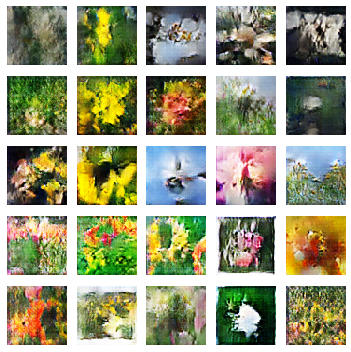

In [61]:
seed = np.random.normal(0, 1, [25, z_noise_dim])

for epoch in range(1, epochs + 1):

  for batch in range(total_batches):
    
    x_real = X[np.random.randint(0, X.shape[0], half_batch)]

    x_noise = np.random.normal(0, 1, [half_batch, z_noise_dim])

    #=== Gradient histograms summary ===#
    disc_summ = sess.run(disc_merged, feed_dict={x_input : x_real, z_input : x_noise, train : True})
    writer.add_summary(disc_summ, epoch)

    gen_summ = sess.run(gen_merged, feed_dict={z_input : x_noise, train : True})
    writer.add_summary(gen_summ, epoch)
    #=== Gradient histograms summary ===#

    _, disc_loss_epoch = sess.run([disc_opt, disc_loss], feed_dict={x_input : x_real, z_input : x_noise, train : True})
    _, gen_loss_epoch = sess.run([gen_opt, gen_loss], feed_dict={z_input : x_noise, train : True})

    #========================= Discriminator and generator loss summaries =================================#
    summary_disc_loss = sess.run(disc_loss_total, feed_dict={x_input:x_real, z_input:x_noise, train:False})
    writer.add_summary(summary_disc_loss, epoch)

    summary_gen_loss = sess.run(gen_loss_total, feed_dict={z_input:x_noise, train:False})
    writer.add_summary(summary_gen_loss, epoch)
    #========================= Discriminator and generator loss summaries =================================#

    if not batch % 1:
      print('Epoch : {}, Batch : {}/{} Disc Loss : {}, Gen Loss : {}'.format(epoch, batch, total_batches, disc_loss_epoch, gen_loss_epoch))
  
  display.clear_output(True)
  print('Previous Epoch : {}, Disc Loss : {}, Gen Loss : {}'.format(epoch, disc_loss_epoch, gen_loss_epoch))
  summarize_plot(output_gen, sess, seed, epoch)

Previous Epoch : 300, Disc Loss : 0.6371539235115051, Gen Loss : 2.080813407897949


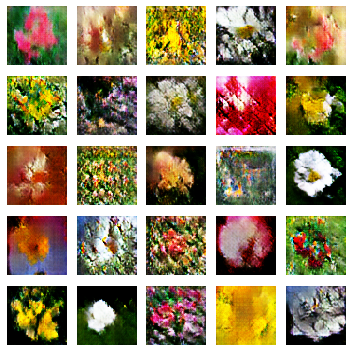

In [43]:
seed = np.random.normal(0, 1, [25, z_noise_dim])

for epoch in range(1, epochs + 1):

  for batch in range(total_batches):
    
    x_real = X[np.random.randint(0, X.shape[0], half_batch)]

    x_noise = np.random.normal(0, 1, [half_batch, z_noise_dim])

    #=== Gradient histograms summary ===#
    disc_summ = sess.run(disc_merged, feed_dict={x_input : x_real, z_input : x_noise, train : True})
    writer.add_summary(disc_summ, epoch)

    gen_summ = sess.run(gen_merged, feed_dict={z_input : x_noise, train : True})
    writer.add_summary(gen_summ, epoch)
    #=== Gradient histograms summary ===#

    _, disc_loss_epoch = sess.run([disc_opt, disc_loss], feed_dict={x_input : x_real, z_input : x_noise, train : True})
    _, gen_loss_epoch = sess.run([gen_opt, gen_loss], feed_dict={z_input : x_noise, train : True})

    #========================= Discriminator and generator loss summaries =================================#
    summary_disc_loss = sess.run(disc_loss_total, feed_dict={x_input:x_real, z_input:x_noise, train:False})
    writer.add_summary(summary_disc_loss, epoch)

    summary_gen_loss = sess.run(gen_loss_total, feed_dict={z_input:x_noise, train:False})
    writer.add_summary(summary_gen_loss, epoch)
    #========================= Discriminator and generator loss summaries =================================#

    if not batch % 1:
      print('Epoch : {}, Batch : {}/{} Disc Loss : {}, Gen Loss : {}'.format(epoch, batch, total_batches, disc_loss_epoch, gen_loss_epoch))

  # x_noise = np.random.normal(0, 1, [batch_size, z_noise_dim])
  # x_real = X[np.random.randint(0, X.shape[0], batch_size)]

  # #=== Gradient histograms summary ===#
  # disc_summ = sess.run(disc_merged, feed_dict={x_input : x_real, z_input : x_noise, train : True})
  # writer.add_summary(disc_summ, epoch)

  # gen_summ = sess.run(gen_merged, feed_dict={z_input : x_noise, train : True})
  # writer.add_summary(gen_summ, epoch)
  # #=== Gradient histograms summary ===#

  # _, disc_loss_epoch = sess.run([disc_opt, disc_loss], feed_dict={x_input : x_real, z_input : x_noise, train : True})
  # _, gen_loss_epoch = sess.run([gen_opt, gen_loss], feed_dict={z_input : x_noise, train : True})

  # #========================= Discriminator and generator loss summaries =================================#
  # summary_disc_loss = sess.run(disc_loss_total, feed_dict={x_input:x_real, z_input:x_noise, train:False})
  # writer.add_summary(summary_disc_loss, epoch)

  # summary_gen_loss = sess.run(gen_loss_total, feed_dict={z_input:x_noise, train:False})
  # writer.add_summary(summary_gen_loss, epoch)
  # #========================= Discriminator and generator loss summaries =================================#

  # if not epoch % 1 :
  display.clear_output(True)
  print('Previous Epoch : {}, Disc Loss : {}, Gen Loss : {}'.format(epoch, disc_loss_epoch, gen_loss_epoch))
  summarize_plot(output_gen, sess, seed, epoch)

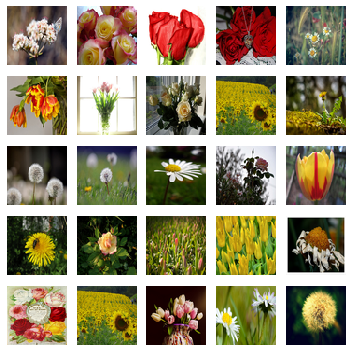

In [45]:
# Real images

fig, axs = plt.subplots(5, 5, figsize=(5, 5))
axs = axs.flatten()

for idx, pt in enumerate( ( X[np.random.randint(0, X.shape[0], 25)] + 1)/2. ): # scale from [-1, 1] to [0, 1]
  axs[idx].imshow(pt, interpolation=None, cmap='binary')
  axs[idx].axis('off')

plt.tight_layout()
plt.show()

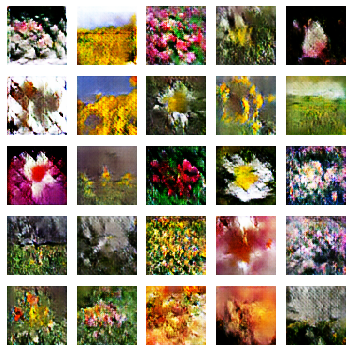

In [47]:
# Fake generated images after training generator

n = 25

z_noise = np.random.normal(0, 1, [n, z_noise_dim])

out = sess.run(output_gen, feed_dict={z_input:z_noise, train:False})

# print(out.min(), out.max())

out = (out+1)/2. # scale from [-1, 1] to [0, 1]

# print(out.min(), out.max())

fig, axs = plt.subplots(5, 5, figsize=(5, 5))
axs = axs.flatten()

for idx, ax in enumerate(axs):
  ax.imshow(out[idx], interpolation='nearest', cmap='binary')
  ax.axis('off')

plt.tight_layout()
plt.show()